# 🏗️Import Necessary Libraries

In [1]:
import matplotlib.pyplot as plt
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import re


import geopandas as gpd
import plotly.express as px
from shapely.geometry import Point
import seaborn as sns
import missingno as msno

pd.set_option('display.max_columns', None)  # Display all columns

### Dataset

In [2]:
df = pd.read_csv(r'C:\Users\User\Downloads\Electric vehicle adoption\Electric_Vehicle_Population_Data.csv')

# View first 10 value on the Dataframe
display(df.head(10))

,VIN (1-10),County,City,State,Postal Code,Model Year,Make,Model,Electric Vehicle Type,Clean Alternative Fuel Vehicle (CAFV) Eligibility,Electric Range,Base MSRP,Legislative District,DOL Vehicle ID,Vehicle Location,Electric Utility,2020 Census Tract
0,5YJ3E1EB4L,Yakima,Yakima,WA,98908.0,2020,TESLA,MODEL 3,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,322,0,14.0,127175366,POINT (-120.56916 46.58514),PACIFICORP,5.307700e+10
1,5YJ3E1EA7K,San Diego,San Diego,CA,92101.0,2019,TESLA,MODEL 3,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,220,0,NaN,266614659,POINT (-117.16171 32.71568),NaN,6.073005e+09
2,7JRBR0FL9M,Lane,Eugene,OR,97404.0,2021,VOLVO,S60,Plug-in Hybrid Electric Vehicle (PHEV),Not eligible due to low battery range,22,0,NaN,144502018,POINT (-123.12802 44.09573),NaN,4.103900e+10
3,5YJXCBE21K,Yakima,Yakima,WA,98908.0,2019,TESLA,MODEL X,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,289,0,14.0,477039944,POINT (-120.56916 46.58514),PACIFICORP,5.307700e+10
4,5UXKT0C5XH,Snohomish,Bothell,WA,98021.0,2017,BMW,X5,Plug-in Hybrid Electric Vehicle (PHEV),Not eligible due to low battery range,14,0,1.0,106314946,POINT (-122.18384 47.8031),PUGET SOUND ENERGY INC,5.306105e+10
5,1N4AZ0CP4F,Snohomish,Everett,WA,98201.0,2015,NISSAN,LEAF,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,84,0,38.0,107901699,POINT (-122.20596 47.97659),PUGET SOUND ENERGY INC,5.306104e+10
6,5YJ3E1EBXJ,Kitsap,Poulsbo,WA,98370.0,2018,TESLA,MODEL 3,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,215,0,23.0,475036313,POINT (-122.64681 47.73689),PUGET SOUND ENERGY INC,5.303594e+10
7,WDC0G5EB0K,Yakima,Naches,WA,98937.0,2019,MERCEDES-BENZ,GLC-CLASS,Plug-in Hybrid Electric Vehicle (PHEV),Not eligible due to low battery range,10,0,14.0,338148968,POINT (-120.69972 46.7309),PACIFICORP,5.307700e+10
8,1N4AZ0CP3D,Kitsap,Port Orchard,WA,98366.0,2013,NISSAN,LEAF,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,75,0,26.0,249239623,POINT (-122.63847 47.54103),PUGET SOUND ENERGY INC,5.303509e+10
9,KNDCC3LD9K,Kitsap,Olalla,WA,98359.0,2019,KIA,NIRO,Plug-in Hybrid Electric Vehicle (PHEV),Not eligible due to low battery range,26,0,26.0,475609368,POINT (-122.54729 47.42602),PUGET SOUND ENERGY INC,5.303509e+10


# 📝Data Preprocessing

In [3]:
df.isnull().sum()

VIN (1-10)                                             0
County                                                 2
City                                                   2
State                                                  0
Postal Code                                            2
Model Year                                             0
Make                                                   0
Model                                                181
Electric Vehicle Type                                  0
Clean Alternative Fuel Vehicle (CAFV) Eligibility      0
Electric Range                                         0
Base MSRP                                              0
Legislative District                                 297
DOL Vehicle ID                                         0
Vehicle Location                                      29
Electric Utility                                     473
2020 Census Tract                                      2
dtype: int64

### Handling Missing Values by Dropping Rows

In our dataset, we have observed that only a small number of rows have missing values in certain columns. Given the overall size of the dataset, dropping these rows will likely have a minimal impact on the accuracy and representativeness of our analysis. 

In [4]:
# Dropping the missing values
df.dropna(inplace = True)

In [5]:
df.isnull().sum()

VIN (1-10)                                           0
County                                               0
City                                                 0
State                                                0
Postal Code                                          0
Model Year                                           0
Make                                                 0
Model                                                0
Electric Vehicle Type                                0
Clean Alternative Fuel Vehicle (CAFV) Eligibility    0
Electric Range                                       0
Base MSRP                                            0
Legislative District                                 0
DOL Vehicle ID                                       0
Vehicle Location                                     0
Electric Utility                                     0
2020 Census Tract                                    0
dtype: int64

# 🛠️Feature Engineering

### Feature Engineering: Extracting Latitude and Longitude

In our dataset, the `Vehicle Location` column contains both latitude and longitude coordinates as a string. To make these coordinates more accessible for further analysis, i perform the feature engineering:




In [6]:
# Convert the 'Vehicle Location' column to string type
df['Vehicle Location'] = df['Vehicle Location'].astype(str)

# Extract the latitude and longitude from the 'Vehicle Location' column
def extract_coordinates(x, index):
    coords = re.findall(r'-?\d+\.\d+', x)
    if len(coords) >= 2:
        return float(coords[index])
    else:
        return None

df['latitude'] = df['Vehicle Location'].apply(lambda x: extract_coordinates(x, 0))
df['longitude'] = df['Vehicle Location'].apply(lambda x: extract_coordinates(x, 1))

df = df.dropna(subset=['latitude', 'longitude'])


### Feature Engineering: Creating a 'Location' Column

In our dataset, we have three columns representing different levels of geographical divisions: `County`, `City`, and `State`. To create a more informative and combined representation of these geographical attributes, we will create a new column called `Location`.


In [7]:
df['Location'] = df['County'] + ', ' + df['City'] + ', ' + df['State']

### Feature Engineering: Creating a *Price_Range_Category* Column

In our dataset, we have observed an unusual distribution of values in the **Base MSRP** column, with a large number of vehicles having a value of 0. This could potentially indicate missing or unknown values in the dataset. To account for this uncertainty and still make use of the available data, we have decided to create a new column called **Price_Range_Category** based on the **Base MSRP** values.



In [8]:
df['Base MSRP'].value_counts()

0         120656
69900       1429
31950        402
52900        167
32250        155
54950        138
59900        127
39995        119
36900         98
44100         97
64950         87
33950         80
45600         74
34995         63
52650         61
36800         51
55700         48
53400         35
110950        21
98950         21
81100         19
75095         16
90700         16
102000        14
184400        12
43700         11
109000         7
89100          6
91250          4
32995          3
845000         1
Name: Base MSRP, dtype: int64

In [9]:
def create_price_range_category(df, column='Base MSRP'):
    def categorize_price(price):
        if price == 0:
            return "Unknown"
        elif price < 40000:
            return "Low"
        elif price < 60000:
            return "Medium"
        else:
            return "High"

    df['Price_Range_Category'] = df[column].apply(categorize_price)
    return df

df = create_price_range_category(df, column='Base MSRP')


### Feature Engineering: Creating an 'Electric_Range_Category' Column

In our dataset, we have observed an unusual distribution of values in the 'Electric Range' column, with a large number of vehicles having a value of 0. This could potentially indicate missing or unknown values in the dataset. To account for this uncertainty and still make use of the available data, we have decided to create a new column called 'Electric_Range_Category' based on the 'Electric Range' values.



In [10]:
df['Electric Range'].value_counts()

0      49346
215     6356
220     4116
84      4033
238     3454
       ...  
95         3
11         1
57         1
59         1
39         1
Name: Electric Range, Length: 101, dtype: int64

In [11]:
def create_electric_range_category(df, column='Electric Range'):
    def categorize_range(electric_range):
        if electric_range == 0:
            return "Unknown"
        elif electric_range < 150:
            return "Short"
        elif electric_range < 300:
            return "Medium"
        else:
            return "Long"

    df['Electric_Range_Category'] = df[column].apply(categorize_range)
    return df

df = create_electric_range_category(df, column='Electric Range')

In [12]:
# Displaying the cleaned and feature engineered DataFrame
display(df.head())

,VIN (1-10),County,City,State,Postal Code,Model Year,Make,Model,Electric Vehicle Type,Clean Alternative Fuel Vehicle (CAFV) Eligibility,Electric Range,Base MSRP,Legislative District,DOL Vehicle ID,Vehicle Location,Electric Utility,2020 Census Tract,latitude,longitude,Location,Price_Range_Category,Electric_Range_Category
0,5YJ3E1EB4L,Yakima,Yakima,WA,98908.0,2020,TESLA,MODEL 3,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,322,0,14.0,127175366,POINT (-120.56916 46.58514),PACIFICORP,5.307700e+10,-120.56916,46.58514,"Yakima, Yakima, WA",Unknown,Long
3,5YJXCBE21K,Yakima,Yakima,WA,98908.0,2019,TESLA,MODEL X,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,289,0,14.0,477039944,POINT (-120.56916 46.58514),PACIFICORP,5.307700e+10,-120.56916,46.58514,"Yakima, Yakima, WA",Unknown,Medium
4,5UXKT0C5XH,Snohomish,Bothell,WA,98021.0,2017,BMW,X5,Plug-in Hybrid Electric Vehicle (PHEV),Not eligible due to low battery range,14,0,1.0,106314946,POINT (-122.18384 47.8031),PUGET SOUND ENERGY INC,5.306105e+10,-122.18384,47.80310,"Snohomish, Bothell, WA",Unknown,Short
5,1N4AZ0CP4F,Snohomish,Everett,WA,98201.0,2015,NISSAN,LEAF,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,84,0,38.0,107901699,POINT (-122.20596 47.97659),PUGET SOUND ENERGY INC,5.306104e+10,-122.20596,47.97659,"Snohomish, Everett, WA",Unknown,Short
6,5YJ3E1EBXJ,Kitsap,Poulsbo,WA,98370.0,2018,TESLA,MODEL 3,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,215,0,23.0,475036313,POINT (-122.64681 47.73689),PUGET SOUND ENERGY INC,5.303594e+10,-122.64681,47.73689,"Kitsap, Poulsbo, WA",Unknown,Medium


# 📊Exploratory Data Analysis

In [13]:
import pandas as pd
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.graph_objs as go

def plot_value_counts(df, column, top_n=None):
    # Get the value counts for the specified column
    value_counts = df[column].value_counts()
    
    if top_n:
        value_counts = value_counts.head(top_n)
    
    # Set up the subplots
    fig, axes = plt.subplots(1, 2, figsize=(20, 7))
    
    # Create the pie chart
    value_counts.plot(kind='pie', ax=axes[0], autopct='%.1f%%', startangle=90, colors=sns.color_palette('pastel'))
    axes[0].set_ylabel('')
    axes[0].set_title(f'Percentage of {column}', fontsize=14)
    
    # Create the bar chart
    sns.barplot(x=value_counts.index, y=value_counts.values, ax=axes[1], palette='pastel')
    axes[1].set_title(f'Count of {column}', fontsize=14)
    axes[1].set_xlabel(column)
    axes[1].set_ylabel('Count')
    axes[1].tick_params(axis='x', rotation=30)

    for i, v in enumerate(value_counts.values):
        axes[1].text(i, v + 0.5, str(v), horizontalalignment='center', fontsize=12)
    
    # Set the suptitle for the entire figure
    fig.suptitle(f'{column} Distribution', fontsize=18, y=1.03)
    
    # Show the plots
    plt.show()
    
    
def plot_coordinates_plotly(df, cmap_column=None, top_n=None):
    # Drop duplicate latitude and longitude pairs
    unique_coordinates = df[['latitude', 'longitude']].drop_duplicates()

    if cmap_column and top_n:
        # Include the cmap_column in the unique_coordinates DataFrame
        unique_coordinates[cmap_column] = df[cmap_column]

        # Get the top N most frequent categories in the specified column
        top_categories = unique_coordinates[cmap_column].value_counts().head(top_n).index.tolist()

        # Filter the unique_coordinates DataFrame to keep only the top N categories
        filtered_coordinates = unique_coordinates[unique_coordinates[cmap_column].isin(top_categories)]

        # Create an interactive scatter plot using Plotly with hover information
        fig = px.scatter(
            filtered_coordinates, x='longitude', y='latitude', color=cmap_column,
            hover_data=[cmap_column, 'latitude', 'longitude'],
            title=f'Latitude and Longitude Points (Top {top_n} {cmap_column})'
        )
    else:
        # Create an interactive scatter plot using Plotly with hover information
        fig = px.scatter(
            unique_coordinates, x='longitude', y='latitude',
            hover_data=['latitude', 'longitude'],
            title='Latitude and Longitude Points'
        )

    # Display the plot
    fig.show()






In [14]:
plot_coordinates_plotly(df)  # Default geolocations without any modifications

# 📍 Top locations to buy EVs

In [15]:

# Get the value counts of 'Location' and create a DataFrame
location_counts = df['Location'].value_counts().reset_index()
location_counts.columns = ['Location', 'Count']

# Display the DataFrame
print(location_counts)

                   Location  Count
0         King, Seattle, WA  21942
1        King, Bellevue, WA   6476
2         King, Redmond, WA   4641
3      Clark, Vancouver, WA   4462
4        King, Kirkland, WA   3920
..                      ...    ...
476      Mason, Matlock, WA      1
477  Douglas, Palisades, WA      1
478    Spokane, Newport, WA      1
479    Skagit, Rockport, WA      1
480  Whitman, Uniontown, WA      1

[481 rows x 2 columns]


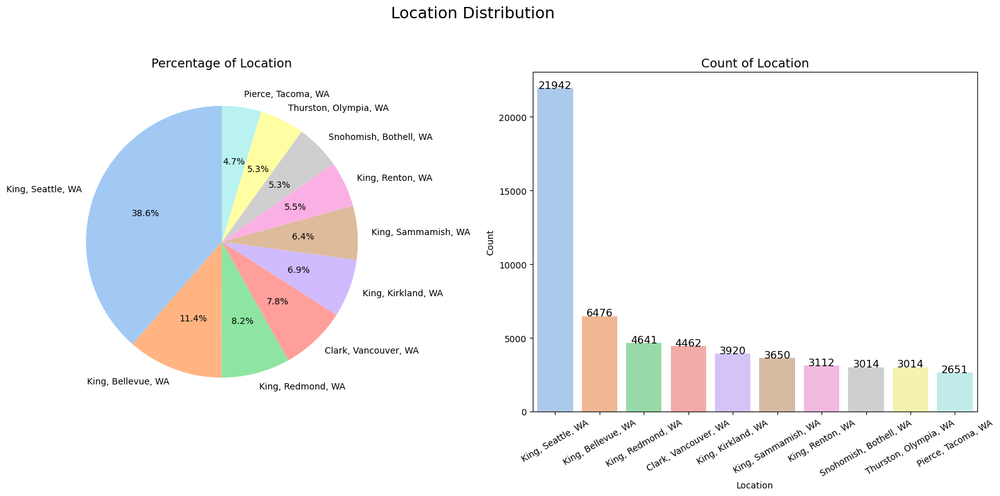

In [16]:
plot_value_counts(df, 'Location', top_n=10)

In [17]:
plot_coordinates_plotly(df, cmap_column='Location', top_n=10) 

### Insights

- The top 10 electric cars count in the dataset are primarily located in the state of Washington (WA), with no cars from other states.
- The highest number of electric cars are located in King county, with Seattle having the highest count of 21942 cars. This indicates that the majority of electric cars are concentrated in urban areas, particularly in large cities like Seattle and Bellevue.
- The next most common location is Clark county, with Vancouver having a count of 4462 cars.



---

## 🌍 Lets Check the Clean Alternative Fuel Vehicle (CAFV) Eligibility



In [18]:
df['Clean Alternative Fuel Vehicle (CAFV) Eligibility'].value_counts()
location_counts.columns = ['Clean Alternative Fuel Vehicle (CAFV) Eligibility', 'Count']

# Display the DataFrame
print(location_counts)

    Clean Alternative Fuel Vehicle (CAFV) Eligibility  Count
0                                   King, Seattle, WA  21942
1                                  King, Bellevue, WA   6476
2                                   King, Redmond, WA   4641
3                                Clark, Vancouver, WA   4462
4                                  King, Kirkland, WA   3920
..                                                ...    ...
476                                Mason, Matlock, WA      1
477                            Douglas, Palisades, WA      1
478                              Spokane, Newport, WA      1
479                              Skagit, Rockport, WA      1
480                            Whitman, Uniontown, WA      1

[481 rows x 2 columns]


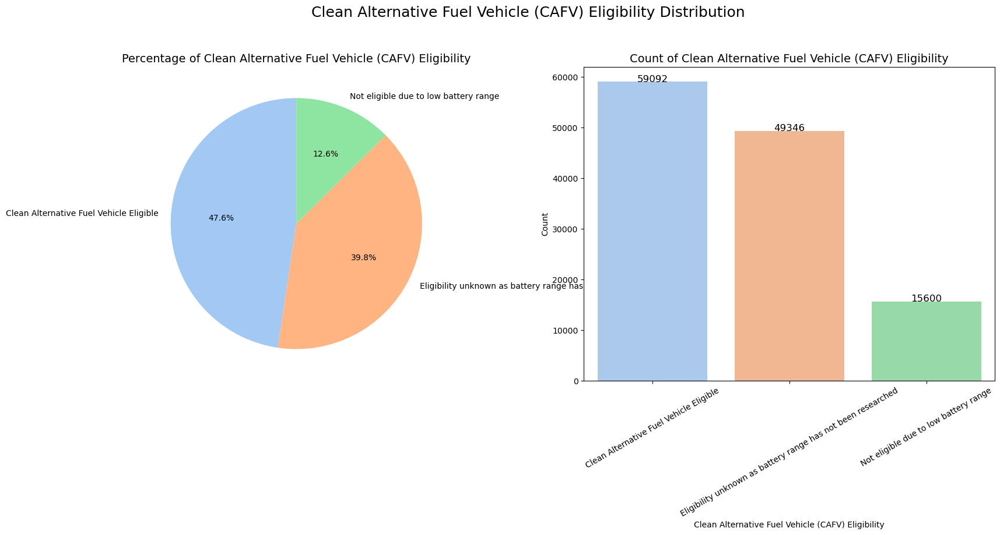

In [19]:
plot_value_counts(df, 'Clean Alternative Fuel Vehicle (CAFV) Eligibility', top_n=3)

In [20]:
plot_coordinates_plotly(df, cmap_column='Clean Alternative Fuel Vehicle (CAFV) Eligibility', top_n=3) 

---

# Who sells the most EVs?



In [21]:
# Get the value counts of 'Make'
make_counts = df['Make'].value_counts().reset_index()
make_counts.columns = ['Make', 'Count']

# Display the DataFrame
print(make_counts)

                    Make  Count
0                  TESLA  56906
1                 NISSAN  12912
2              CHEVROLET  10797
3                   FORD   6635
4                    BMW   5556
5                    KIA   4831
6                 TOYOTA   4631
7             VOLKSWAGEN   3356
8                   AUDI   2472
9                  VOLVO   2324
10               HYUNDAI   1996
11                  JEEP   1925
12              CHRYSLER   1893
13                RIVIAN   1425
14               PORSCHE    898
15                  FIAT    808
16                 HONDA    796
17                  MINI    710
18         MERCEDES-BENZ    651
19              POLESTAR    634
20            MITSUBISHI    617
21                 SMART    272
22                JAGUAR    219
23               LINCOLN    198
24                SUBARU    184
25          LUCID MOTORS    117
26              CADILLAC    111
27                 LEXUS     54
28               GENESIS     44
29            LAND ROVER     36
30      

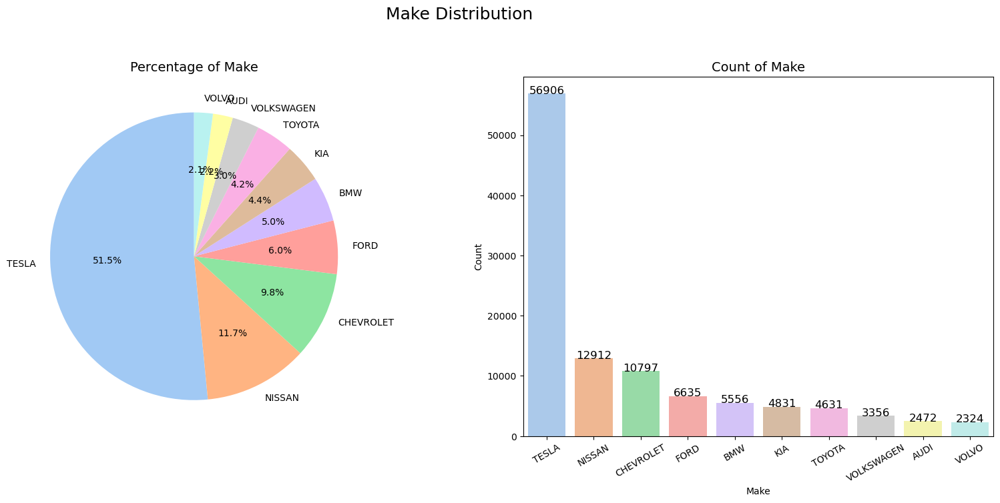

In [22]:
plot_value_counts(df, 'Make', top_n=10)
# run this code to view

In [23]:
plot_coordinates_plotly(df, cmap_column='Make', top_n=10) 

###  Insights

- The majority of electric cars in the dataset are from the Tesla make, with 56,906 cars falling into this category.
- The next most common makes are Nissan and Chevrolet, with 12,912 and 10,797 cars respectively.
- The rest of the makes have relatively smaller counts, with Volvo having the lowest count of 2,324 cars.


# 🚘Top 10 EV models nationally

In [24]:
from tabulate import tabulate

# Get the value counts of 'Model'
model_counts = df['Model'].value_counts().reset_index()
model_counts.columns = ['Model', 'Count']

# Display the DataFrame
print(model_counts)

           Model  Count
0        MODEL 3  24300
1        MODEL Y  20609
2           LEAF  12890
3        MODEL S   7314
4        BOLT EV   4974
..           ...    ...
115     BENTAYGA      2
116      RZ 450E      1
117          918      1
118  FLYING SPUR      1
119  S-10 PICKUP      1

[120 rows x 2 columns]


In [25]:
# Get the value counts of 'Make'
model_counts = df['Model'].value_counts().reset_index()
model_counts.columns = ['Model', 'Count']

# Display the DataFrame
print(model_counts)

           Model  Count
0        MODEL 3  24300
1        MODEL Y  20609
2           LEAF  12890
3        MODEL S   7314
4        BOLT EV   4974
..           ...    ...
115     BENTAYGA      2
116      RZ 450E      1
117          918      1
118  FLYING SPUR      1
119  S-10 PICKUP      1

[120 rows x 2 columns]


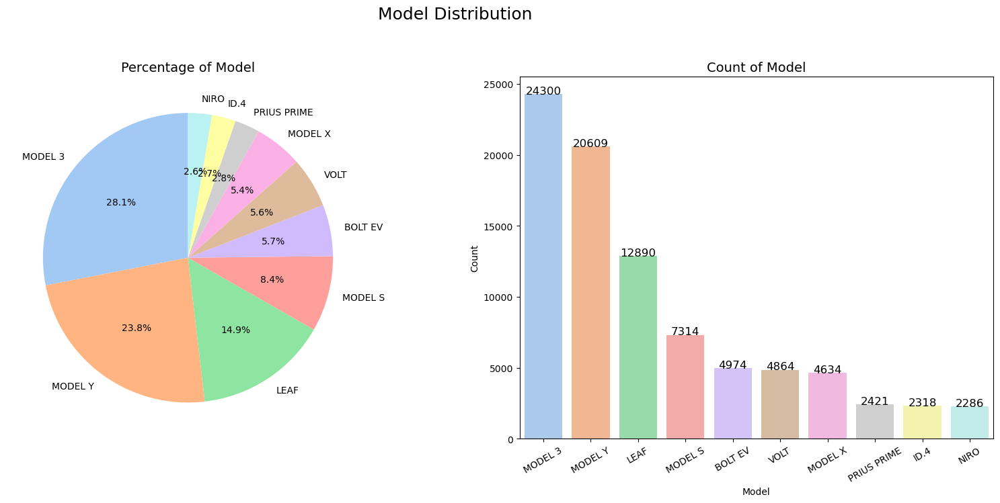

In [26]:
plot_value_counts(df, 'Model', top_n=10)

In [27]:
plot_coordinates_plotly(df, cmap_column='Model', top_n=10) 

###  Insights

- The most common model of electric car in the dataset is the Tesla Model 3, with 24,300 cars falling into this category.
- The next most common model is the Tesla Model Y, with 20,609 cars.
- The Nissan Leaf is the third most common model, with 12,890 cars.
- The remaining models have relatively smaller counts, with the Niro having the lowest count of 2,286 cars.



<Axes: title={'center': 'Top 10 EV Models in King County'}>

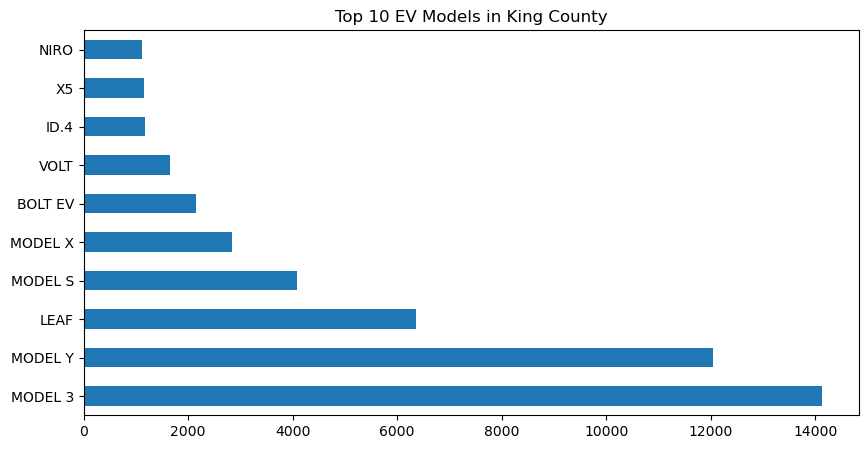

In [28]:
# Top 10 EV models in King County
king_df = df[df['County'] == 'King']
king_df.sample(1)
king_df['Model'].value_counts().head(10).plot(kind='barh', figsize=(10, 5), title='Top 10 EV Models in King County')

##  Lets See which Type of Vehicle sells more



In [29]:
# Get the value counts of 'Electric Vehicle Type'
Electric_Vehicle_Type_counts = df['Electric Vehicle Type'].value_counts().reset_index()
Electric_Vehicle_Type_counts.columns = ['Electric Vehicle Type', 'Count']

# Display the DataFrame
print(Electric_Vehicle_Type_counts)

                    Electric Vehicle Type  Count
0          Battery Electric Vehicle (BEV)  95753
1  Plug-in Hybrid Electric Vehicle (PHEV)  28285


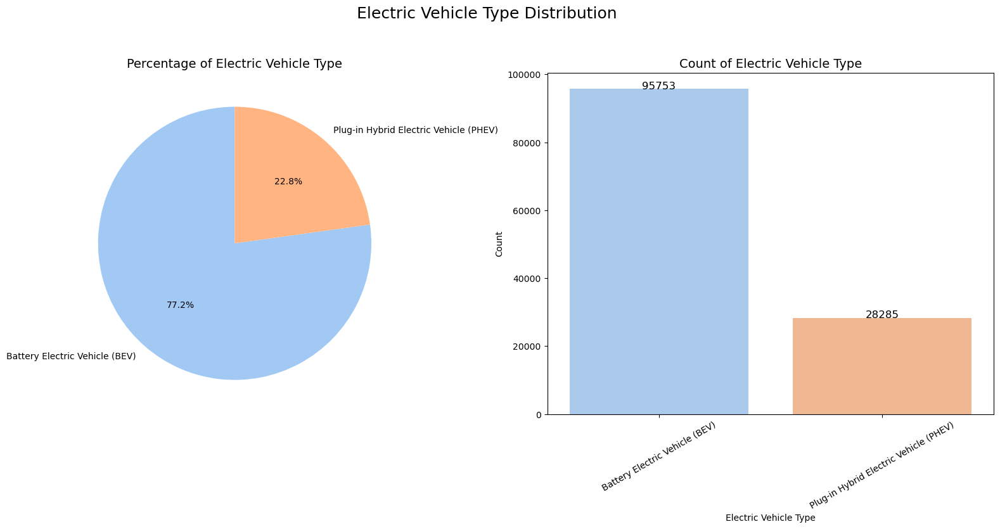

In [30]:
plot_value_counts(df, 'Electric Vehicle Type', top_n=2)

In [31]:
plot_coordinates_plotly(df, cmap_column='Electric Vehicle Type', top_n=2) 

###  Insights

- Battery electric vehicles (BEVs) are the most common type of electric vehicle in the dataset, with 95,753 cars falling into this category.
- The next most common type is plug-in hybrid electric vehicles (PHEVs), with 28,285 cars.
- There are no other types of electric vehicles in the dataset, indicating that the majority of electric cars are either BEVs or PHEVs.



#  💵 Lets See the Price Range Category

In [32]:
# Get the value counts of 'Price Range Category'
Price_Range_Category_counts = df['Price_Range_Category'].value_counts().reset_index()
Price_Range_Category_counts.columns = ['Price_Range_Category', 'Count']

# Display the DataFrame
print(Price_Range_Category_counts)

  Price_Range_Category   Count
0              Unknown  120656
1                 High    1653
2                  Low     971
3               Medium     758


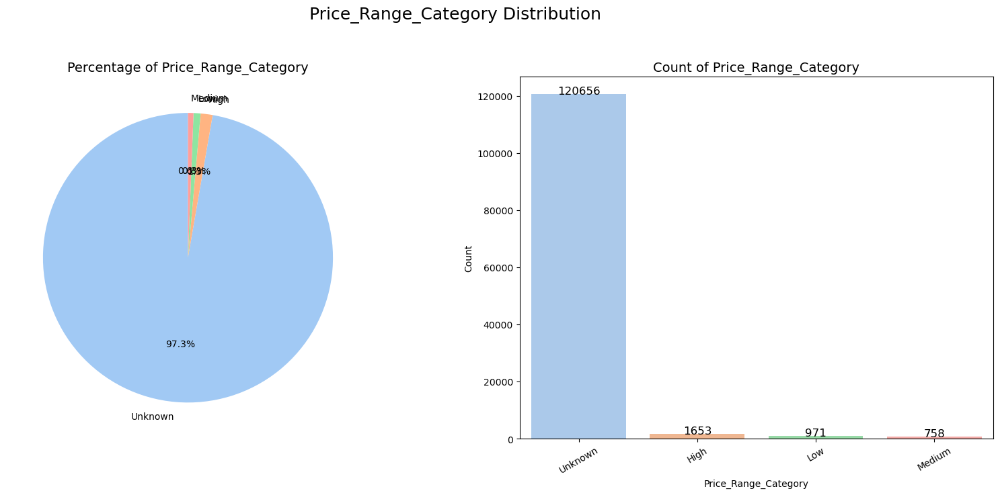

In [33]:
plot_value_counts(df, 'Price_Range_Category', top_n=4)

In [34]:
plot_coordinates_plotly(df, cmap_column='Price_Range_Category', top_n=4) 

### Insights

- The majority of electric cars in the dataset have an unknown price range category, with 120,656 cars falling into this category. This is likely due to a large number of vehicles having a value of 0 in the 'Base MSRP' column.
- Only a small percentage of electric cars have a defined price range category, with 1,653 cars falling into the 'High' category, 971 cars falling into the 'Low' category, and 758 cars falling into the 'Medium' category.
- The price range categories are defined based on the 'Base MSRP' values, with a value of 0 indicating an unknown price range.



# Electric Utility Basis

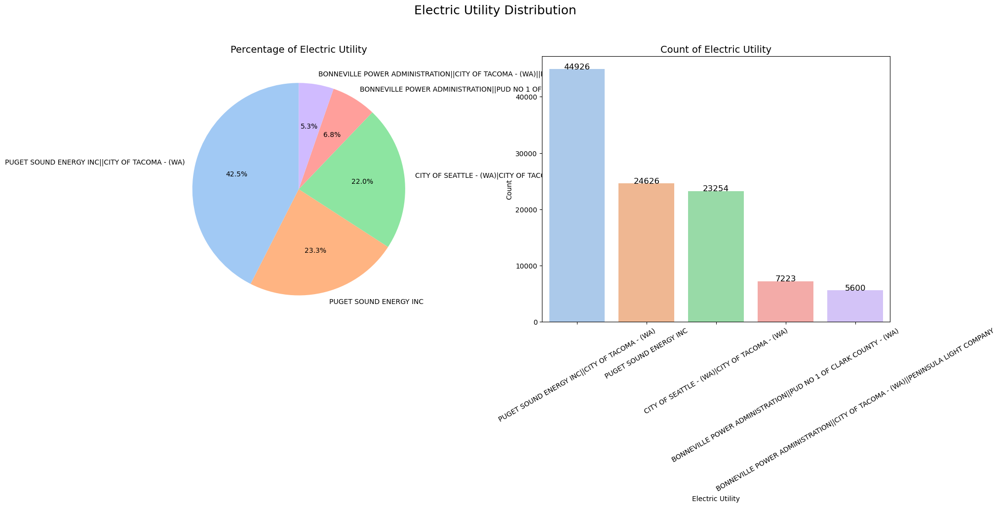

In [35]:
plot_value_counts(df, 'Electric Utility', top_n=5)

In [36]:
plot_coordinates_plotly(df, cmap_column='Electric Utility', top_n=5) 

# Electric Range vs. Base MSRP



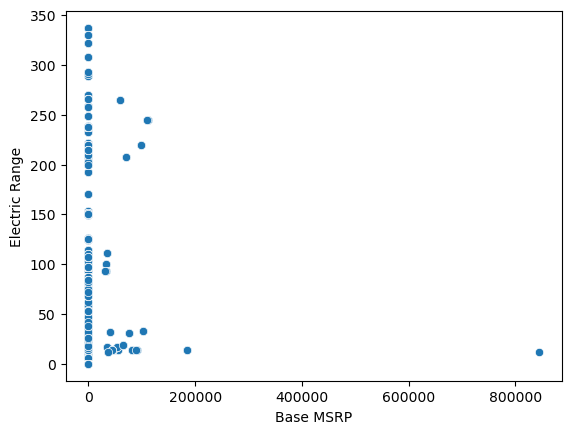

In [37]:
# Create a scatter plot of EV price vs. range
ax= sns.scatterplot(x='Base MSRP', y='Electric Range', data=df)

As a lot of subsidies were introduced to buy EVs at Base MSRP of zero, EV base price is not a factor of Electric Range



# Distribution of Electric range by Make

In [38]:
# Create a Scatter plot using Plotly Express with color to visualize the distribution of electric range by make
fig = px.scatter(df, x='Make', y='Electric Range',
             title='Electric Range by Make',
             labels={'Make': 'Make', 'Electric Range': 'Electric Range'},
             color='Make',  # Adding color to distinguish makes
             width=800, height=400)
fig.update_xaxes(tickangle=45)

# Show the interactive plot
fig.show()

# Model Year vs Electric Range

In [39]:
#Box plot for Model Year vs Electric Range
fig = px.box(df, x='Model Year', y='Electric Range', title='Model Year vs. Electric Range')
fig.show()

# Finding the correlation

In [40]:
df.corr()

C:\Users\User\AppData\Local\Temp\ipykernel_8396\1134722465.py:1: FutureWarning:

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.



,Postal Code,Model Year,Electric Range,Base MSRP,Legislative District,DOL Vehicle ID,2020 Census Tract,latitude,longitude
Postal Code,1.000000,-0.055112,-0.019721,-0.007553,-0.425269,-0.004742,0.015427,0.616943,-0.520359
Model Year,-0.055112,1.000000,-0.356197,-0.226482,0.001964,-0.024547,-0.027073,0.002297,-0.009787
Electric Range,-0.019721,-0.356197,1.000000,0.092890,0.025070,-0.005430,-0.014434,-0.007778,0.017351
Base MSRP,-0.007553,-0.226482,0.092890,1.000000,0.012904,-0.005393,-0.002032,-0.003424,0.007515
Legislative District,-0.425269,0.001964,0.025070,0.012904,1.000000,-0.003551,-0.108695,-0.330075,0.227283
DOL Vehicle ID,-0.004742,-0.024547,-0.005430,-0.005393,-0.003551,1.000000,-0.002266,0.004355,0.000665
2020 Census Tract,0.015427,-0.027073,-0.014434,-0.002032,-0.108695,-0.002266,1.000000,0.097737,0.467219
latitude,0.616943,0.002297,-0.007778,-0.003424,-0.330075,0.004355,0.097737,1.000000,-0.045478
longitude,-0.520359,-0.009787,0.017351,0.007515,0.227283,0.000665,0.467219,-0.045478,1.000000


C:\Users\User\AppData\Local\Temp\ipykernel_8396\1016504775.py:3: FutureWarning:

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.



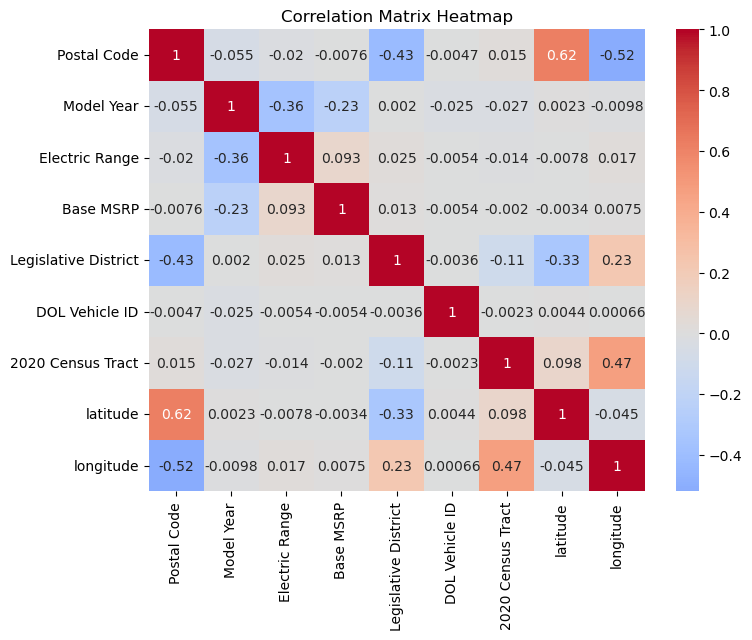

In [41]:
# Create a heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(df.corr(), annot=True, cmap='coolwarm', center=0)
plt.title('Correlation Matrix Heatmap')
plt.show()

In [42]:
#Extract relevant columns for the analysis
analysis = df[['Make', 'Model', 'Base MSRP', 'Electric Range', 'Electric Vehicle Type', 'Electric Utility']]

#Calculate the price range of electric vehicles
price_range = analysis['Base MSRP'].min(), analysis['Base MSRP'].max()

#Calculate summary statistics for pricing
price_statistics = analysis['Base MSRP'].describe()

#Calculate the correlation between pricing and other factors (if needed)
correlation = analysis.corr()

# Display the results
print("Price Range of Electric Vehicles:")
print(price_range)

print("\nSummary Statistics for Pricing:")
print(price_statistics)

print("\nCorrelation between Pricing and Other Factors:")
print(correlation)

Price Range of Electric Vehicles:
(0, 845000)

Summary Statistics for Pricing:
count    124038.000000
mean       1558.507433
std       10058.282971
min           0.000000
25%           0.000000
50%           0.000000
75%           0.000000
max      845000.000000
Name: Base MSRP, dtype: float64

Correlation between Pricing and Other Factors:
                Base MSRP  Electric Range
Base MSRP         1.00000         0.09289
Electric Range    0.09289         1.00000


C:\Users\User\AppData\Local\Temp\ipykernel_8396\1738410995.py:11: FutureWarning:

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.



# Number of Unique make per year

In [43]:

# Group the data by Model Year and Make, then count the unique makes in each year
yearly_make_counts = df.groupby('Model Year')['Make'].nunique().reset_index()

# Find the year with the highest number of makes
max_make_year = yearly_make_counts[yearly_make_counts['Make'] == yearly_make_counts['Make'].max()]['Model Year'].values[0]

# Create the bar plot using Plotly Express
fig = px.bar(yearly_make_counts, x='Model Year', y='Make', title='Number of Unique Makes per Model Year')
fig.update_xaxes(tickangle=45)
fig.add_vline(x=max_make_year, line_dash="dash", line_color="red", name=f'Highest ({max_make_year})')

fig.show()

# Create a Racing Bar Plot to display the animation of EV Make and its count each year.

In [44]:
# Convert 'Model Year' column to string format
df['Model Year'] = pd.to_datetime(df['Model Year'], format='%Y').dt.year.astype(str)

# Group data by 'Model Year' and 'Make' to get the count of each EV Make for each year
ev_make_count = df.groupby(['Model Year', 'Make']).size().reset_index(name='Count')

# Create the Racing Bar Plot
fig = px.bar(
    ev_make_count,
    x='Make',
    y='Count',
    animation_frame='Model Year',
    animation_group='Make',
    range_y=[0, ev_make_count['Count'].max() + 10],  # Adjust y-axis range for better visualization
    title='EV Make Count Over the Years',
)

# Set the layout and labels for better visualization
fig.update_layout(
    xaxis_title='EV Make',
    yaxis_title='Count',
    showlegend=False,
    title_font_size=24,
)

# Show the Racing Bar Plot
fig.show()

# Electric Vehicles Adoption trend 

In [45]:
import plotly.express as px
# Grouping the data by model years and calculate the count of electric vehicles for each year
ev_counts_by_year = df.groupby('Model Year').size().reset_index(name='Count')

# Creating a line plot using Plotly Express to visualize the trends in electric vehicle adoption over model years
fig = px.line(ev_counts_by_year, x='Model Year', y='Count',
              title='Electric Vehicle Adoption Trends over Model Years',
              labels={'Model Year': 'Model Year', 'Count': 'Number of Electric Vehicles'})
fig.update_xaxes(tickangle=45)

# Show the interactive plot
fig.show()